# Introduction
- <b>Author:</b> Wendy Ha (Swinburne University of Technology)
- <b>Data:</b> UCI Machine Learning - Pima Indians Diabetes Dataset: https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database

Diabetes, according to the World Health Organization, is a chronic disease that occurs when blood glucose levels are abnormally high, posing a risk to several body organs such as the heart, eyes, kidneys, and lungs (World Health Organization 2020). There is currently no cure for diabetes, but it is possible to predict an individual's likelihood of developing the disease using medical indicators such as blood pressure, glucose levels, insulin levels and genetics.

Recognizing the importance of early diabetes diagnosis, this project utilised the Pima Indians diabetic dataset from the machine learning repository at the University of California, Irvine to develop a <b>supervised classification</b> machine learning model. Through the application of data science, this initiative aims to assist medical practitioners in increasing the life expectancy of women in the community.



# Task 1 – Problem Formulation, Data Acquisition and Preparation

In [86]:
# Import Libraries
import pandas as pd
import numpy as np
import io
import matplotlib.pyplot as plt
import seaborn as sns
import re
import missingno
import warnings
warnings.filterwarnings("ignore")

# Packages for Data Modelling Process
from sklearn.preprocessing import MinMaxScaler 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

## 1.1 Data Selection

In [87]:
asm2_data = pd.read_csv('diabetes.csv')
asm2_data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


### 1.1.1 Checking number of rows and columns

In [88]:
# Checking columns name
asm2_data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [89]:
# Checking number of rows and columns
print("\nNumber of rows and columns in the Pima Indians Diabetes data set: ", asm2_data.shape)


Number of rows and columns in the Pima Indians Diabetes data set:  (768, 9)


### 1.1.2 Checking data types and ranges

In [90]:
# Checking data types
asm2_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [91]:
# Checking data ranges
asm2_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


### 1.1.3 Variables description

The data granularity below has been provided by National Institute of Diabetes and Digestive and Kidney Diseases and UCI Machine Learning Repository 2016.

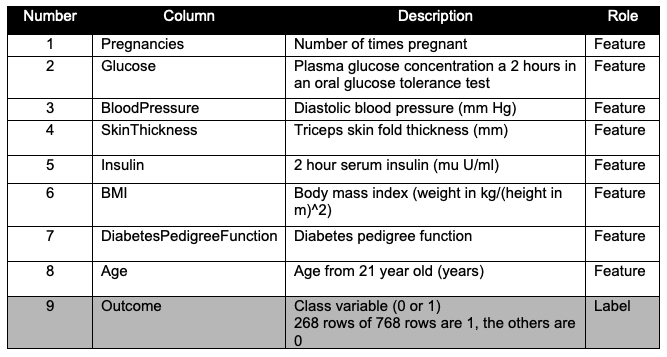

### Findings:
**1. Number of rows:** 
- The data set contains 768 rows and is mainly for Female gender.

**2. Number of columns:**
- The data set contains 09 columns:
 - 08 columns represent clinical parameters: Pregnancies, Glucose, Blood Pressure, Skin Thickness, Insulin, Body Mass Index (BMI), Diabetes Pedigree Function, and Age.
 - 01 remaining column, Outcome, is the target parameter.

**3. Data types:**
- 06 numerical columns:
 - Glucose, Blood Pressure, Skin Thickness, Insulin: Integer data type
 - BMI, Diabetes Pedigree Function: Floating number data type
- 03 categorical columns:
 - Outcome (label column): has only two distinct values, 0 (min) and 1 (max), where 0 means non-diabetes and 1 means diabetes
 - Age (independent column): ranging from 21 (min) to 81 (max) years old, can be devided to multiple age groups, such as 0-30, 30-50, 50-70 and 70+, it is categorical data.
 - Pregnancies (independent column): similar to the Age, the number of time pregnant ranging from 0 (minimum) to 17 (maximum) can be separated into subgroups for analysis; therefore, this column can also be labeled categorical.

## 1.2 Data Preparation

### 1.2.1 Missing values

### 1.2.1.1 Missing values detection

In [92]:
#checking null values
asm2_data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [93]:
asm2_data.describe().T[['min', 'max']]

,min,max
Pregnancies,0.000,17.00
Glucose,0.000,199.00
BloodPressure,0.000,122.00
SkinThickness,0.000,99.00
Insulin,0.000,846.00
BMI,0.000,67.10
DiabetesPedigreeFunction,0.078,2.42
Age,21.000,81.00
Outcome,0.000,1.00


### Findings:
1. None of 09 columns have null values.
2. 07 attributes have a minimum value of 0.
- It is normal for 02 columns, Outcome and Number of Pregnancies, to have a value of 0.
- 05 columns, Glucose, Blood Pressure, Skin Thickness, Insulin, and Body Mass Index, are indicators of a person's survival, hence a zero value is unscientific. For instance, if a person is living, their blood pressure or glucose levels cannot be 0.

These 0 values may have been encoded from raw Null data during the prior data acquisition process. Consequently, to continue investigation, we must convert 0 to Null.

### 1.2.1.2 Replacing 0 to NaN value

In [94]:
#Replace 0 to NaN value
asm2_data[['Glucose','BloodPressure','SkinThickness','BMI', 'Insulin']]= asm2_data[['Glucose','BloodPressure','SkinThickness','BMI', 'Insulin']].replace(0,np.nan)

In [95]:
asm2_data.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [96]:
def nulls_breakdown(asm2_data=asm2_data):
    dataframe_cols = list(asm2_data.columns)
    cols_total_count = len(list(asm2_data.columns))
    cols_count = 0
    for loc, col in enumerate(dataframe_cols):
        null_count = asm2_data[col].isnull().sum()
        total_count = asm2_data[col].isnull().count()
        percent_null = round(null_count/total_count*100, 2)
        if null_count > 0:
            cols_count += 1
            print('[iloc = {}] {} has {} null values: {}% null'.format(loc, col, null_count, percent_null))
    cols_percent_null = round(cols_count/cols_total_count*100, 2)
    print('Out of {} total columns, {} contain null values; {}% columns contain null values.'.format(cols_total_count, cols_count, cols_percent_null))

In [97]:
nulls_breakdown()

[iloc = 1] Glucose has 5 null values: 0.65% null
[iloc = 2] BloodPressure has 35 null values: 4.56% null
[iloc = 3] SkinThickness has 227 null values: 29.56% null
[iloc = 4] Insulin has 374 null values: 48.7% null
[iloc = 5] BMI has 11 null values: 1.43% null
Out of 9 total columns, 5 contain null values; 55.56% columns contain null values.


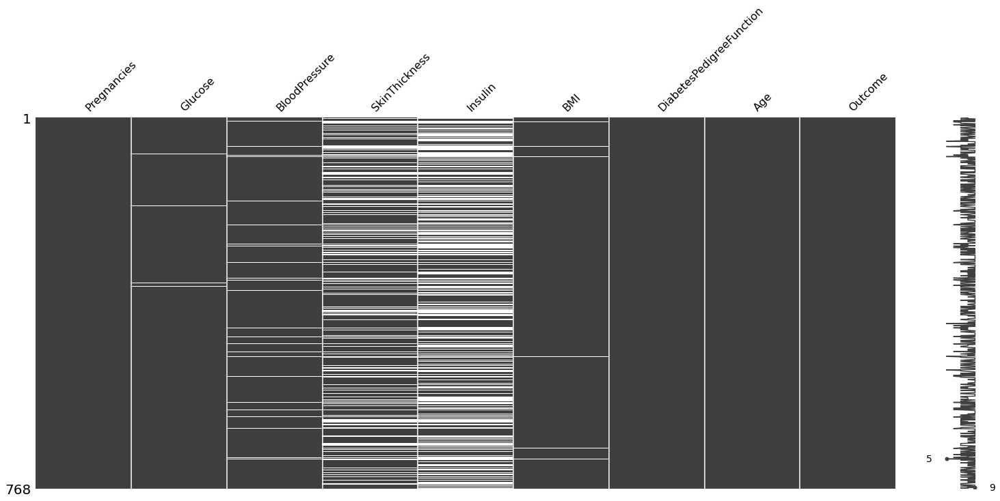

In [98]:
missingno.matrix(asm2_data)
plt.show()

#### Findings:
Among 5 columns contain Null values:
- SkinThickness and Insulin had the largest proportion of missing values, 29.56 and 48.7 percent, respectively.
- Glucose, BloodPressure, and BMI got the percentage of null just below 5%.
> To determine whether to replace these null values with the mean or median, in next step we must examine the distribution of each column

### 1.2.1.3 Handling Null data by approriate Mean and Median values

array([[<AxesSubplot:title={'center':'Pregnancies'}>,
        <AxesSubplot:title={'center':'Glucose'}>,
        <AxesSubplot:title={'center':'BloodPressure'}>],
       [<AxesSubplot:title={'center':'SkinThickness'}>,
        <AxesSubplot:title={'center':'Insulin'}>,
        <AxesSubplot:title={'center':'BMI'}>],
       [<AxesSubplot:title={'center':'DiabetesPedigreeFunction'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Outcome'}>]], dtype=object)

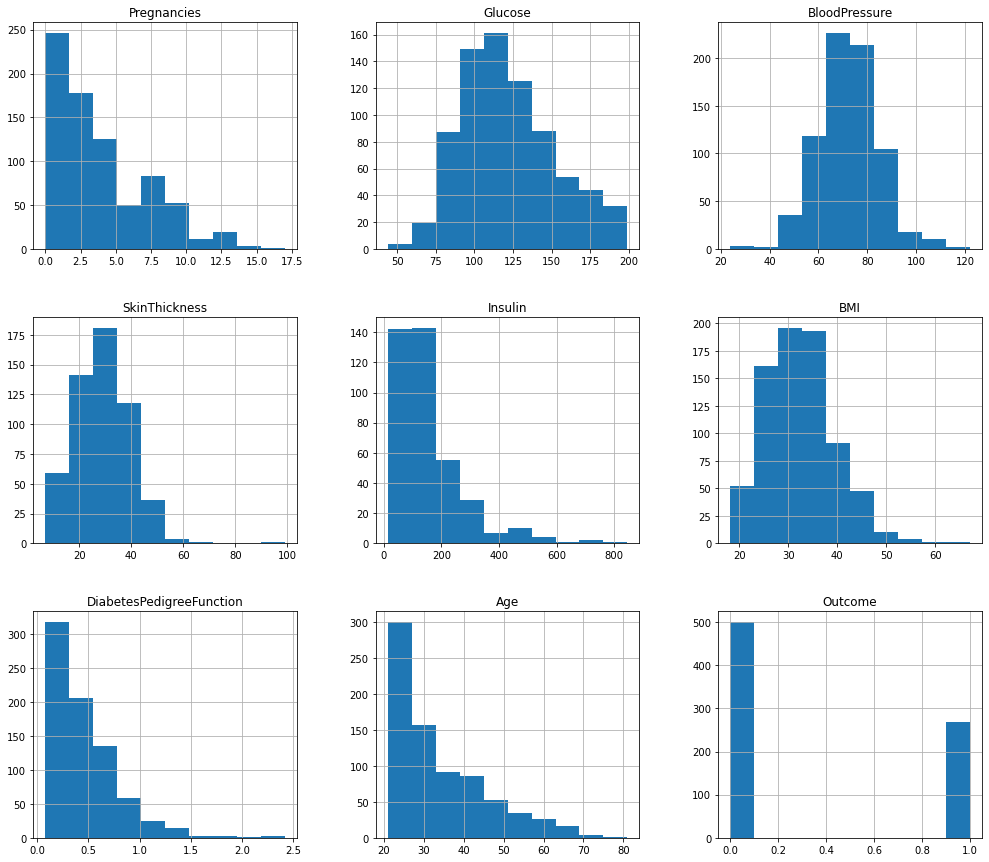

In [99]:
#Checking data distribution by histogram
asm2_data.hist(figsize=(17,15))

### Findings: 
- The histogram above indicates that <b>Glucose</b> and <b>BloodPressure</b> have roughly normal distributions; hence, null values in these columns can be replaced with the <b>MEAN</b>.
-  For <b>Insulin, SkinThickness, and BMI,</b> the data skew to the left is excessively pronounced; hence, the <b>MEDIAN</b> should be used to replace null values.

In [100]:
# Filling null values in 'Insulin', 'SkinThickness', 'BMI' columns with the MEDIAN.
for col in ['Insulin', 'SkinThickness', 'BMI']:
    asm2_data[col] = asm2_data[col].fillna(asm2_data[col].median())
#asm2_data['Insulin', 'SkinThickness', 'BMI'] = asm2_data['Insulin'].fillna(asm2_data['Insulin'].median()) 

In [101]:
# Filling null values in Glucose, BloodPressure columns with the MEAN.
for col in ['Glucose', 'BloodPressure']:
    asm2_data[col] = asm2_data[col].fillna(asm2_data[col].mean())

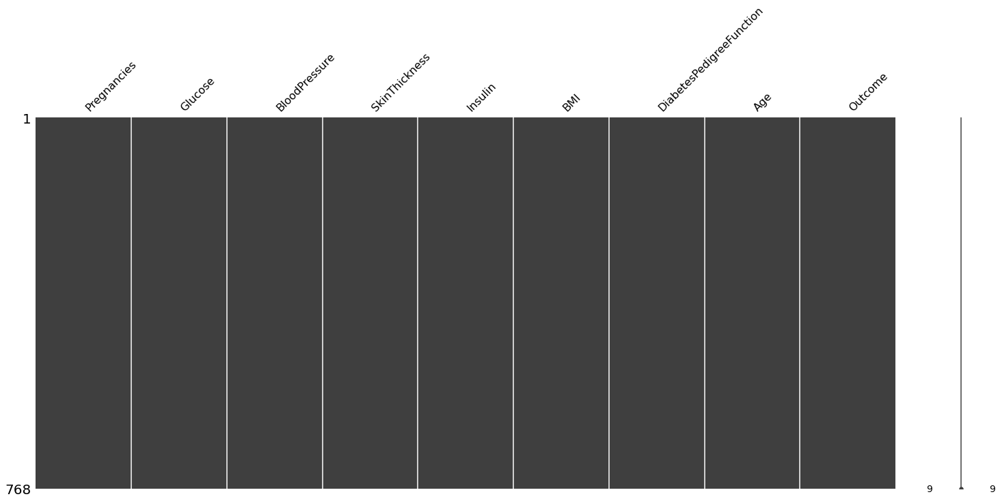

In [102]:
#Re-check null values again
missingno.matrix(asm2_data)
plt.show()

The project data set no longer contains missing values.

### 1.2.2 Detect Outliers

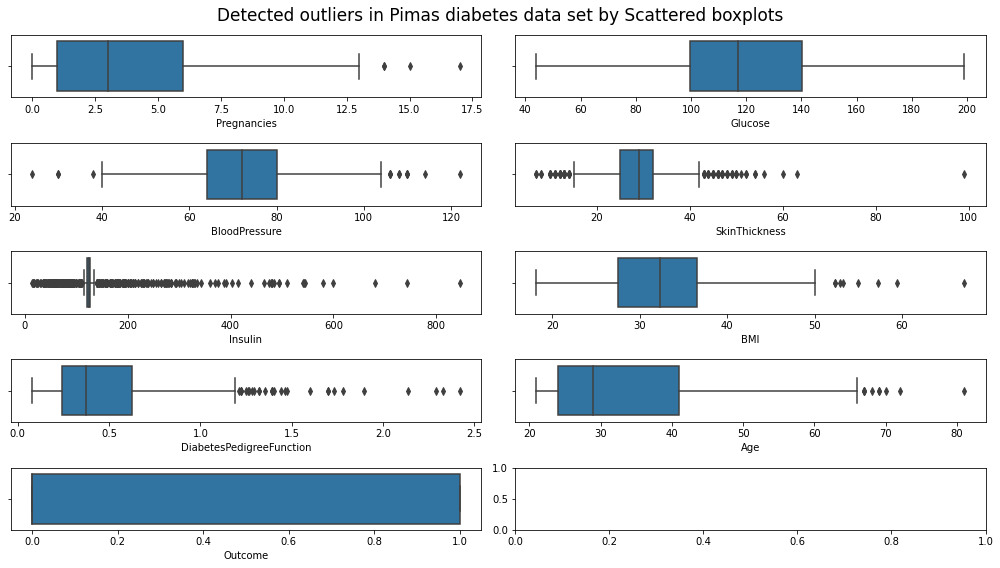

In [103]:
fig, ax = plt.subplots(nrows = 5, ncols = 2, figsize = (14,8))
for column, subplot in zip(asm2_data, ax.flatten()):
    sns.boxplot(x = asm2_data[column], ax = subplot)

fig.suptitle('Detected outliers in Pimas diabetes data set by Scattered boxplots', fontsize=17)
fig.tight_layout()
plt.show()

### Findings:
- <b>Insulin, DiabetesPedigreeFunction, and SkinThickness</b> are the features with the greatest number of outliers among the eight independent columns.
- Outliers can influence the accuracy of several classification models, such as KNN and Logistic Regression, hence they will be preserved.

## 1.3 Conclusions
In the end of the data preprocessing process, the <b>project_data</b> has been modified so that:
- It no longer contains missing value.
- It has been decided to keep outliers.

This data set is now ready for the model development process.

# Task 2 – Data Exploration

## 2.1 Explore distribution of Non-Diabetic (0) and Diabetes (1) data in each independent parameter

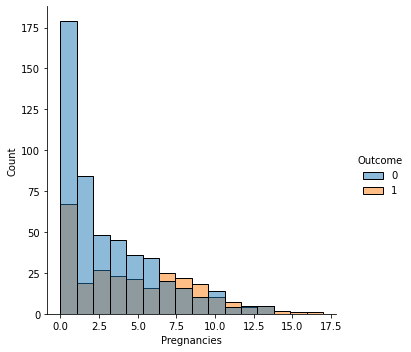

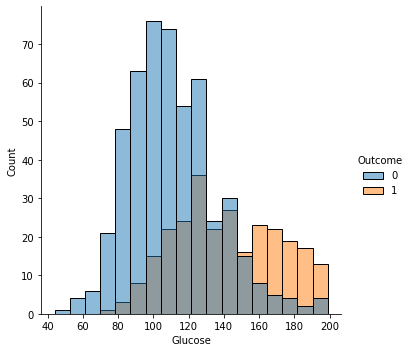

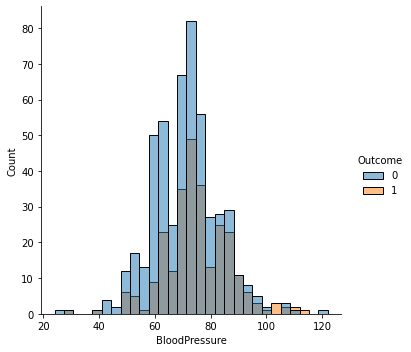

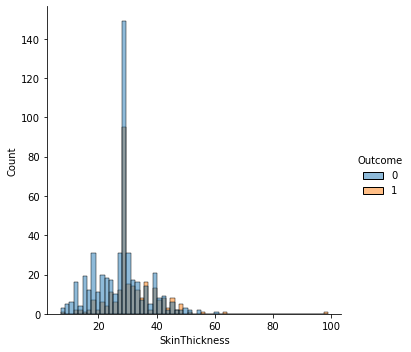

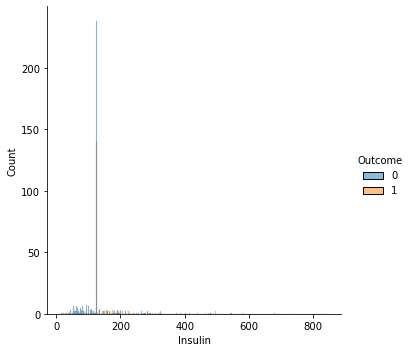

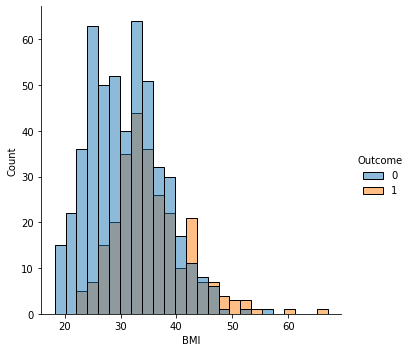

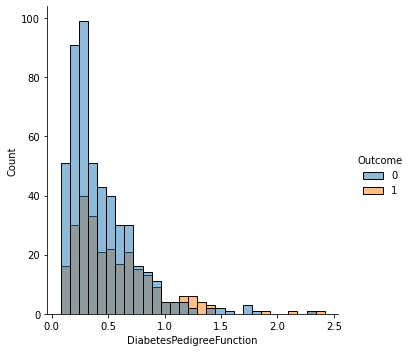

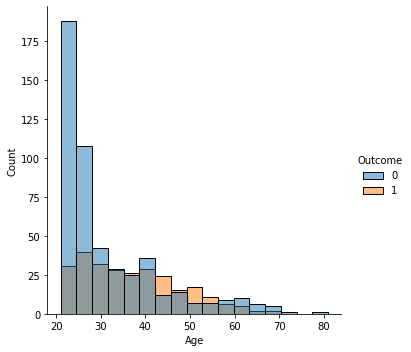

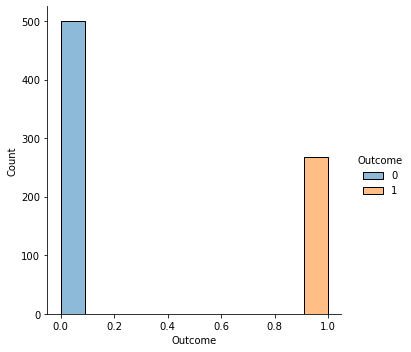

In [164]:
#Using sns.displot() to check distribution of Outcome (0 = Non-Diabetes, 1 = Diabetes) in each variable
axes = axes.ravel() 
for column, ax in zip(asm2_data, axes):
    data = asm2_data[[col, 'Outcome']]  # select the data
    sns.displot(data=asm2_data, x=asm2_data[column], hue='Outcome', ax=ax)

### Findings:
- As indicated by the above displots, the selected data set contains an imbalance between the number of outcome 1 (diabetes) and outcomes 0 (non-diabetes).
- Specifically, the most recent displot revealed that the number of females diagnosed without diabetes was double the number of females diagnosed with diabetes.

## 2.2 Relationship between features

### 2.2.1 Using Scatter Plot identifies relation among all variables

array([[<AxesSubplot:xlabel='Pregnancies', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='Glucose', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='BloodPressure', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='SkinThickness', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='Insulin', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='BMI', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='DiabetesPedigreeFunction', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='Age', ylabel='Pregnancies'>,
        <AxesSubplot:xlabel='Outcome', ylabel='Pregnancies'>],
       [<AxesSubplot:xlabel='Pregnancies', ylabel='Glucose'>,
        <AxesSubplot:xlabel='Glucose', ylabel='Glucose'>,
        <AxesSubplot:xlabel='BloodPressure', ylabel='Glucose'>,
        <AxesSubplot:xlabel='SkinThickness', ylabel='Glucose'>,
        <AxesSubplot:xlabel='Insulin', ylabel='Glucose'>,
        <AxesSubplot:xlabel='BMI', ylabel='Glucose'>,
        <AxesSubplot:xlabel='DiabetesPedigreeFunction', 

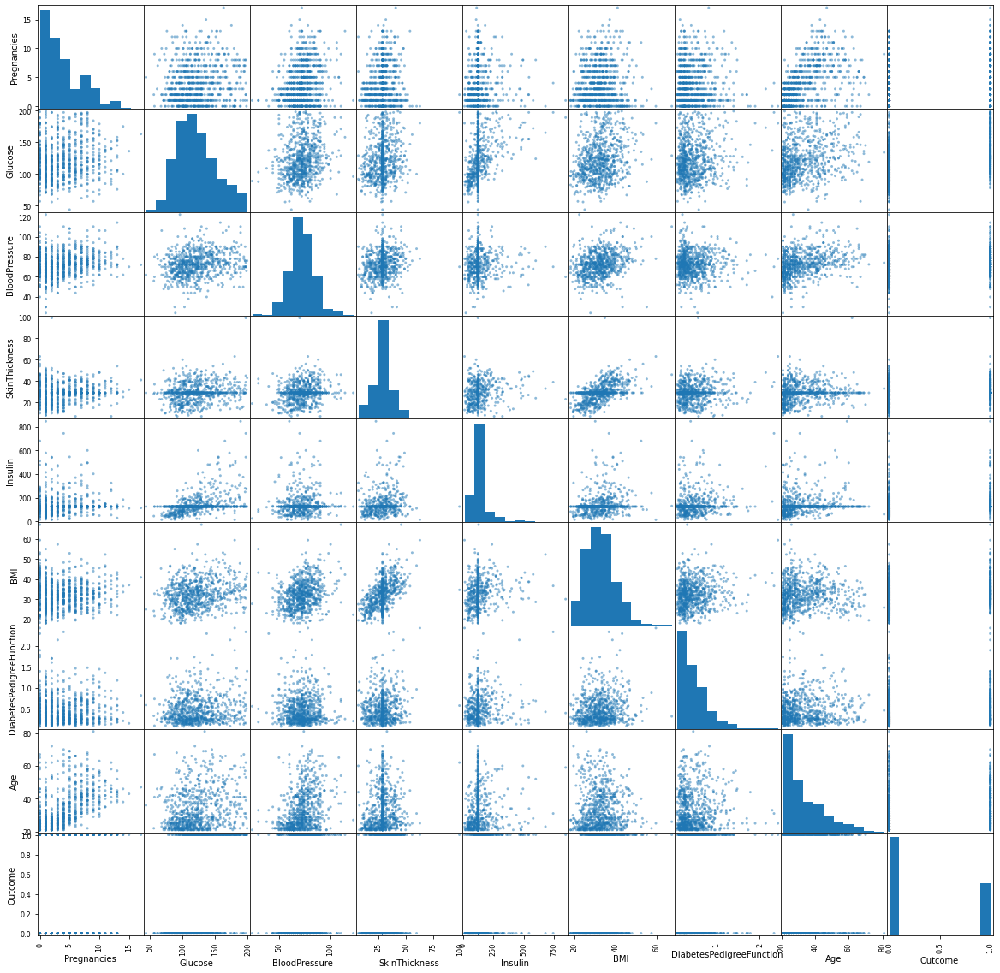

In [105]:
pd.plotting.scatter_matrix(asm2_data, figsize=(20, 20))

### 2.2.2 Using Heat Map identifies relation among all variables

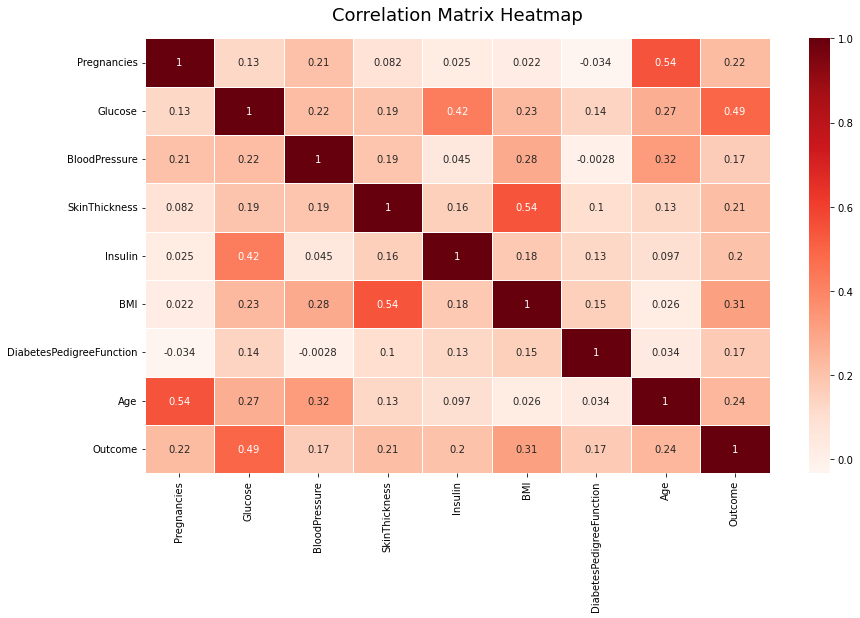

In [106]:
corr = asm2_data.corr()
fig, ax = plt.subplots(figsize = (14,8))
sns.heatmap(corr, annot = True, cmap = 'Reds', linewidths = 0.5, ax = ax)
plt.title('Correlation Matrix Heatmap', fontsize=18, pad=18)
plt.show()

## 2.3 Formulate Hypothesis

### Hypothesis 1: Which variables increase the likelihood of diabetes in women?
Glucose, BMI, Pregnancies, Diabetes Pedigree Function and Age are primary medical indicators that have a positive correlation with the development of diabetes. This can be discussed in detail as follows: 
- <b>In terms of Glucose:</b> As explained by Australia Department of Health, during the process of eating, a portion of the food's sugar is absorbed by the human body. If this amount of sugar is not metabolised and instead builds up excessively in the blood, a situation known as hyperglycemia develops, leading to diabetes (Australia Government - Department of Health 2019). 


- <b>In terms of Body Max Index (BMI):</b> As the level of fat in the body increases, tissues and cells become more resistant and limit the production of the hormone insulin, hence increasing the risk of diabetes (Diabetes Australia 2020). This is evident from the BMI displot illustrated in section 2.1, which classifies women with a BMI 25-29.9 $kg/m^2$ as "overweight" or "pre-obese", with a BMI 30.0-34.9 $kg/m^2$ as "obesity class 1", with a BMI 35.0-39.9 $kg/m^2$ as "obesity class 2", and with a BMI 40 $kg/m^2$ or more as "severe obesity" (Diabetes Australia 2020). All individuals in these high BMI groups were diagnosed with diabetes.


- <b>In terms of Diabetes Pedigree Function:</b> People with a family history of diabetes, especially a parent, are more likely to inherit the diabetes-causing genes (Diabetes Australia 2020).


- <b>In terms of Age:</b> As people get older, their cells become insulin-resistant and the pancreas produces less insulin than when they were younger. Consequently, diabetes is common among the elderly (Diabetes Australia 2020).


- <b>In terms of Pregnancies:</b> During pregnancy, the placenta produces a hormone that aids in the development of the foetus but restricts insulin production by the pancreas. Moreover, the blood glucose levels of pregnant women are frequently high, and they gain weight as well. This results in gestational diabetes, a form of diabetes that occurs during pregnancy. After a woman is diagnosed with gestational diabetes, the risk of having diabetes later in her life is extremely high (Diabetes Australia 2020).

On the other hand, <b>blood pressure, insulin, and skin thickness</b> also affect the likelihood of developing diabetes, but not significantly.

### Hypothesis 2: How does pregnancy cause detrimental effects to women clinical parameters?
Insulin, Skin Thickness, and Diabetes Pedigree Function all correlate negatively with Pregnancies. In particular, during pregnancy, insulin levels in female's body frequently decline because of a hormone generated by the placenta. Additionally, as the size of the foetus increases, the skin of pregnant women grows thinner. The more the number of pregnancies a woman has, the less elastic her skin gets (Australia Government - Department of Health 2019).

Furthermore, as previously mentioned, some women do not have diabetes before they get pregnant; they develop gestational diabetes only during pregnancy, and the majority of these women return to being nondiabetic after giving birth (Diabetes Australia 2020). Therefore, the inverse correlation between Pregnancies and Diabetes Pedigree Function implies that not all examined women in the Pima diabetes data set contain the hereditary diabetes gene.

# Task 3 – Data Modelling

## 3.1 Building Base Model

### 3.1.1 Splitting the dataset into dependent and independent features

In [131]:
x = asm2_data.drop('Outcome', axis = 1)
y = asm2_data['Outcome']

In [132]:
#Checking scale of independent features
x.describe().T[['min', 'max']]

,min,max
Pregnancies,0.000,17.00
Glucose,44.000,199.00
BloodPressure,24.000,122.00
SkinThickness,7.000,99.00
Insulin,14.000,846.00
BMI,18.200,67.10
DiabetesPedigreeFunction,0.078,2.42
Age,21.000,81.00


#### Finding: 
08 independent features all have different ranges, we need normalizing them to be between 0 and 1

### 3.1.2 Scaling the independent features by MinMaxScaler

In [133]:
#MinMaxScaler has default feature_range=(0, 1)
scaler = MinMaxScaler()
scaler.fit(x)
X = scaler.fit_transform(x)
X

array([[0.35294118, 0.67096774, 0.48979592, ..., 0.31492843, 0.23441503,
        0.48333333],
       [0.05882353, 0.26451613, 0.42857143, ..., 0.17177914, 0.11656704,
        0.16666667],
       [0.47058824, 0.89677419, 0.40816327, ..., 0.10429448, 0.25362938,
        0.18333333],
       ...,
       [0.29411765, 0.49677419, 0.48979592, ..., 0.16359918, 0.07130658,
        0.15      ],
       [0.05882353, 0.52903226, 0.36734694, ..., 0.24335378, 0.11571307,
        0.43333333],
       [0.05882353, 0.31612903, 0.46938776, ..., 0.24948875, 0.10119556,
        0.03333333]])

### 3.1.3 Developing base functions

### 3.1.3.1 Base function to find best value of the hyperparameter

In [134]:
def tune_hyperparameter (model, x_train, y_train, isKnn = True):
    print ('Find best value for hyperparameter by GridSearchCV')
    print(15*'-')
    if isKnn == True:
        para = {'n_neighbors':np.arange(1,11)}
    else:
        para = {'max_depth':np.arange(1,11)}
    model_cv= GridSearchCV(model,para, cv=10)
    model_cv.fit(x_train, y_train)   
    print("- Best cv_scores:" + str(model_cv.best_score_))
    print("- Best parameter: " + str(model_cv.best_params_))

### 3.1.3.2 Base function to evaluate performance of each chosen classification model

In [135]:
def model_evaluation(model, x_train, y_train, x_test, y_test, train = True):
    #Train set
    if train == True:
        y_train_pred = model.predict(x_train)
        print("\n"+35*'*'+"\n")
        print ('\033[1m TRAIN RESULT  \033[0m'+"\n")
        print (f"1/ Confusion Matrix: \n {confusion_matrix(y_train, y_train_pred)}")
        print(f"2/ Accuracy Score: {accuracy_score(y_train, y_train_pred)}")
        print(f"3/ F1 Score: {f1_score(y_train, y_train_pred, average='weighted')}")
        print(f"4/ Classification Report: \n {classification_report(y_train, y_train_pred)}")
    #Test set
    if train == False:
        y_test_pred = model.predict(x_test)
        print("\n" + 35*'*'+"\n")
        print ('\033[1m TEST RESULT  \033[0m'+"\n")
        print (f"1/ Confusion Matrix: \n {confusion_matrix(y_test, y_test_pred)}")
        print(f"2/ Accuracy Score: {accuracy_score(y_test, y_test_pred)}")
        print(f"3/ F1 Score: {f1_score(y_test, y_test_pred, average='weighted')}")
        print(f"4/ Classification Report: \n {classification_report(y_test, y_test_pred)}")

### 3.1.3.3 Base function to compare performance of 02 chosen classification models

In [136]:
def model_comparision(model_1, model_2, x_test, y_test):
    y_test_pred1 = model_1.predict(x_test)
    y_test_pred2 = model_2.predict(x_test)
    as_1 = accuracy_score(y_test, y_test_pred1)
    as_2 = accuracy_score(y_test, y_test_pred2)
    f1_sc1=f1_score(y_test, y_test_pred1, average='weighted')
    f1_sc2=f1_score(y_test, y_test_pred2, average='weighted')
    model_cp = {}
    model_cp['K-nearest Neighbors Classifier'] = [as_1, f1_sc1]
    model_cp['Decision Tree Classifier'] = [as_2, f1_sc2]
    model_cp_df = pd.DataFrame.from_dict(model_cp).T
    model_cp_df.columns = ['Accuracy', 'F1 Score']
    return model_cp_df

### 3.1.3.4 Base function to visualise comparison metrics of 02 chosen classification model

In [138]:
def model_compare_visual (data):
    data.plot(kind="barh", figsize=(12, 10))
    plt.title("Classification Models Comparison for splitting dataset ", fontsize=18, pad=20)
    plt.xlabel("Metrics", fontsize=13)
    plt.ylabel("Type of Classification Model", fontsize=13)
    plt.show()

## 3.2 Suite 1: 50% for training and 50% for testing 

### 3.2.1 Stratified splitting the dataset into training and testing set

In [139]:
#Suite 1: 50% for training and 50% for testing 
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size = 0.5, random_state = 42, stratify = y)

### 3.2.2 Model 1: K-nearest Neighbors Algorithm

#### Find best value of the hyperparameter "n_neighbors"

In [140]:
knn_core1 = KNeighborsClassifier()
tune_hyperparameter (knn_core1, X_train1, y_train1, True)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.794331983805668
- Best parameter: {'n_neighbors': 9}


#### Evaluate K-nearest Neighbors Algorithm Performance

In [141]:
knn_s1 = KNeighborsClassifier(n_neighbors = 9)
knn_s1.fit(X_train1, y_train1)

print ('\033[1m SUIT 1: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(knn_s1, X_train1, y_train1, X_test1, y_test1, True)
model_evaluation(knn_s1, X_train1, y_train1, X_test1, y_test1, False)

 SUIT 1: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[232  18]
 [ 45  89]]
2/ Accuracy Score: 0.8359375
3/ F1 Score: 0.8309500165345218
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.93      0.88       250
           1       0.83      0.66      0.74       134

    accuracy                           0.84       384
   macro avg       0.83      0.80      0.81       384
weighted avg       0.84      0.84      0.83       384


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[213  37]
 [ 59  75]]
2/ Accuracy Score: 0.75
3/ F1 Score: 0.7440893374450986
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.85      0.82       250
           1       0.67      0.56      0.61       134

    accuracy                           0.75       384
   macro avg       0.

### 3.2.3 Model 2: Decision Tree Algorithm

#### Find best value of the hyperparameter "max_depth"

In [142]:
dt_core1 = DecisionTreeClassifier()
tune_hyperparameter (dt_core1 , X_train1, y_train1, False)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.7707152496626181
- Best parameter: {'max_depth': 1}


#### Evaluate Decision Tree Algorithm Performance

In [143]:
dt_s1 = DecisionTreeClassifier(max_depth = 1)
dt_s1.fit(X_train1, y_train1)

print ('\033[1m SUIT 1: DECISION TREE MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(dt_s1, X_train1, y_train1, X_test1, y_test1, True)
model_evaluation(dt_s1, X_train1, y_train1, X_test1, y_test1, False)

 SUIT 1: DECISION TREE MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[218  32]
 [ 56  78]]
2/ Accuracy Score: 0.7708333333333334
3/ F1 Score: 0.764810933133108
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.80      0.87      0.83       250
           1       0.71      0.58      0.64       134

    accuracy                           0.77       384
   macro avg       0.75      0.73      0.74       384
weighted avg       0.77      0.77      0.76       384


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[198  52]
 [ 60  74]]
2/ Accuracy Score: 0.7083333333333334
3/ F1 Score: 0.7061427417726631
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.77      0.79      0.78       250
           1       0.59      0.55      0.57       134

    accuracy                           0.71       384
   ma

### 3.2.4 Models comparison

#### Comparing metrics approach

In [147]:
s1model_compare=model_comparision(knn_s1, dt_s1, X_test1, y_test1)
s1model_compare

,Accuracy,F1 Score
K-nearest Neighbors Classifier,0.750000,0.744089
Decision Tree Classifier,0.708333,0.706143


#### Visualizing performance's difference between 02 models

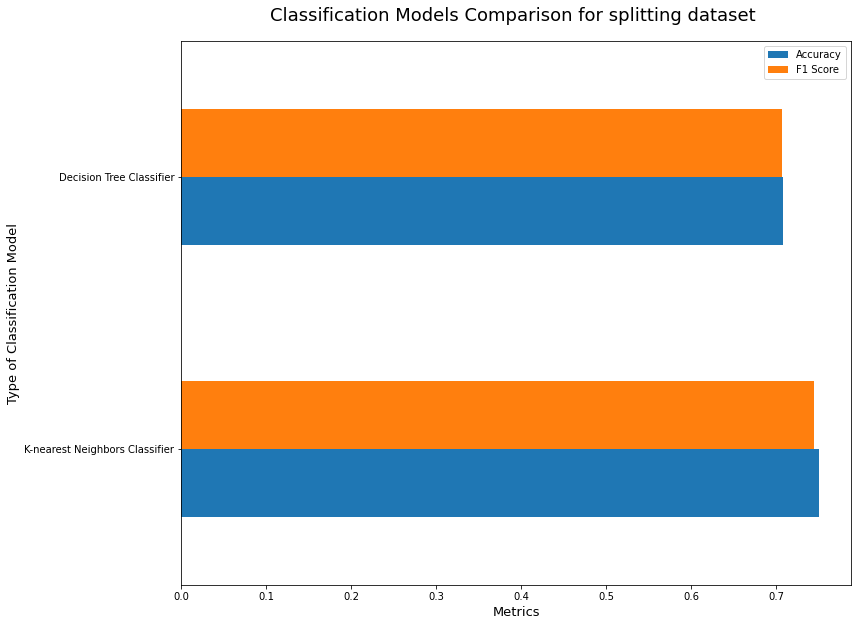

In [148]:
model_compare_visual(s1model_compare)

## 3.3 Suite 2: 60% for training and 40% for testing

### 3.3.1 Stratified splitting the dataset into training and testing set:

In [149]:
#Suite 2: 60% for training and 40% for testing
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size = 0.4, random_state = 42, stratify = y)

### 3.3.2 Model 1: K-nearest Neighbors Algorithm

#### Find best value of the hyperparameter "n_neighbors"

In [150]:
knn_core2 = KNeighborsClassifier()
tune_hyperparameter (knn_core2, X_train2, y_train2, True)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.7717391304347826
- Best parameter: {'n_neighbors': 3}


#### Evaluate K-nearest Neighbors Algorithm Performance

In [151]:
knn_s2 = KNeighborsClassifier(n_neighbors = 3)
knn_s2.fit(X_train2, y_train2)

print ('\033[1m SUIT 2: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(knn_s2, X_train2, y_train2, X_test2, y_test2, True)
model_evaluation(knn_s2, X_train2, y_train2, X_test2, y_test2, False)

 SUIT 2: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[269  30]
 [ 35 126]]
2/ Accuracy Score: 0.8586956521739131
3/ F1 Score: 0.8581671034940963
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.88      0.90      0.89       299
           1       0.81      0.78      0.79       161

    accuracy                           0.86       460
   macro avg       0.85      0.84      0.84       460
weighted avg       0.86      0.86      0.86       460


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[164  37]
 [ 46  61]]
2/ Accuracy Score: 0.7305194805194806
3/ F1 Score: 0.7275545711187513
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.82      0.80       201
           1       0.62      0.57      0.60       107

    accuracy                           0.73       30

### 3.2.3 Model 2: Decision Tree Algorithm

#### Find best value of the hyperparameter "max_depth"

In [152]:
dt_core2 = DecisionTreeClassifier()
tune_hyperparameter (dt_core2, X_train2, y_train2, False)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.7804347826086957
- Best parameter: {'max_depth': 7}


#### Evaluate Decision Tree Algorithm Performance

In [153]:
dt_s2 = DecisionTreeClassifier(max_depth = 7)
dt_s2.fit(X_train2, y_train2)

print ('\033[1m SUIT 2: DECISION TREE MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(dt_s2, X_train2, y_train2, X_test2, y_test2, True)
model_evaluation(dt_s2, X_train2, y_train2, X_test2, y_test2, False)

 SUIT 2: DECISION TREE MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[273  26]
 [ 15 146]]
2/ Accuracy Score: 0.9108695652173913
3/ F1 Score: 0.9115065661914045
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.95      0.91      0.93       299
           1       0.85      0.91      0.88       161

    accuracy                           0.91       460
   macro avg       0.90      0.91      0.90       460
weighted avg       0.91      0.91      0.91       460


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[145  56]
 [ 38  69]]
2/ Accuracy Score: 0.6948051948051948
3/ F1 Score: 0.6994916452082399
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.79      0.72      0.76       201
           1       0.55      0.64      0.59       107

    accuracy                           0.69       308
   m

### 3.2.4 Models comparison

#### Comparing metrics approach

In [154]:
s2model_compare=model_comparision(knn_s2, dt_s2, X_test2, y_test2)
s2model_compare

,Accuracy,F1 Score
K-nearest Neighbors Classifier,0.730519,0.727555
Decision Tree Classifier,0.694805,0.699492


#### Visualizing performance's difference between 02 models

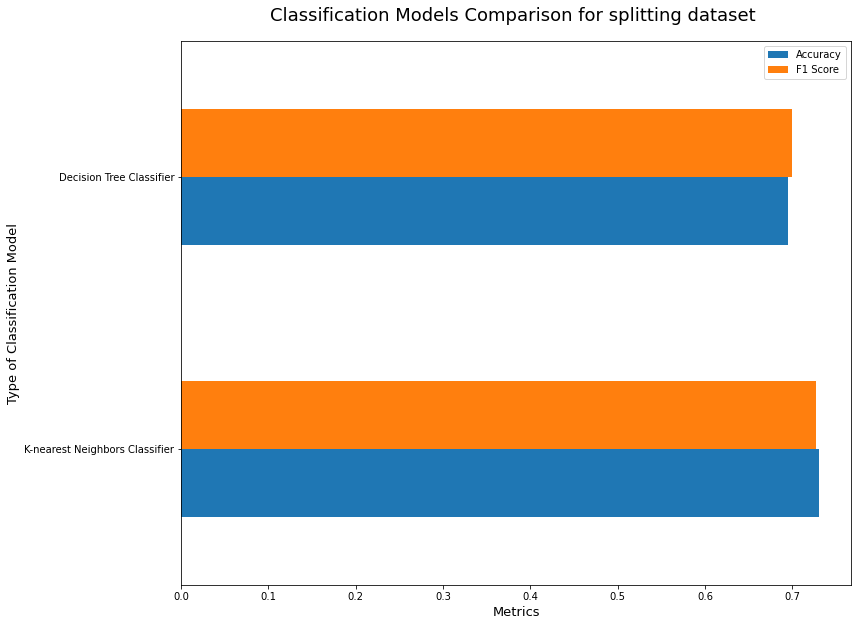

In [155]:
model_compare_visual(s2model_compare)

## 3.4 Suite 3: 80% for training and 20% for testing

### 3.3.1 Stratified splitting the dataset into training and testing set:

In [156]:
#Suite 3: 80% for training and 20% for testing 
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

### 3.3.2 Model 1: K-nearest Neighbors Algorithm

#### Find best value of the hyperparameter "n_neighbors"

In [157]:
knn_core3 = KNeighborsClassifier()
tune_hyperparameter (knn_core3, X_train3, y_train3, True)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.7558170280274987
- Best parameter: {'n_neighbors': 5}


#### Evaluate K-nearest Neighbors Algorithm Performance

In [158]:
knn_s3 = KNeighborsClassifier(n_neighbors = 5)
knn_s3.fit(X_train3, y_train3)

print ('\033[1m SUIT 3: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(knn_s3, X_train3, y_train3, X_test3, y_test3, True)
model_evaluation(knn_s3, X_train3, y_train3, X_test3, y_test3, False)

 SUIT 3: K-NEAREST NEIGHBORS MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[352  48]
 [ 54 160]]
2/ Accuracy Score: 0.8338762214983714
3/ F1 Score: 0.8333135734886754
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.87      0.88      0.87       400
           1       0.77      0.75      0.76       214

    accuracy                           0.83       614
   macro avg       0.82      0.81      0.82       614
weighted avg       0.83      0.83      0.83       614


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[83 17]
 [24 30]]
2/ Accuracy Score: 0.7337662337662337
3/ F1 Score: 0.7290418482842073
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.83      0.80       100
           1       0.64      0.56      0.59        54

    accuracy                           0.73       154
  

### 3.2.3 Model 2: Decision Tree Algorithm

#### Find best value of the hyperparameter "max_depth"

In [159]:
dt_core3 = DecisionTreeClassifier()
tune_hyperparameter (dt_core3, X_train3, y_train3, False)

Find best value for hyperparameter by GridSearchCV
---------------
- Best cv_scores:0.7490481226864093
- Best parameter: {'max_depth': 3}


#### Evaluate Decision Tree Algorithm Performance

In [160]:
dt_s3 = DecisionTreeClassifier(max_depth = 3)
dt_s3.fit(X_train3, y_train3)

print ('\033[1m SUIT 3: DECISION TREE MODEL PERFORMANCE EVALUATION  \033[0m')
model_evaluation(dt_s3, X_train3, y_train3, X_test3, y_test3, True)
model_evaluation(dt_s3, X_train3, y_train3, X_test3, y_test3, False)

 SUIT 3: DECISION TREE MODEL PERFORMANCE EVALUATION  

***********************************

 TRAIN RESULT  

1/ Confusion Matrix: 
 [[388  12]
 [130  84]]
2/ Accuracy Score: 0.7687296416938111
3/ F1 Score: 0.7395774514725741
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.75      0.97      0.85       400
           1       0.88      0.39      0.54       214

    accuracy                           0.77       614
   macro avg       0.81      0.68      0.69       614
weighted avg       0.79      0.77      0.74       614


***********************************

 TEST RESULT  

1/ Confusion Matrix: 
 [[92  8]
 [40 14]]
2/ Accuracy Score: 0.6883116883116883
3/ F1 Score: 0.6441888420109835
4/ Classification Report: 
               precision    recall  f1-score   support

           0       0.70      0.92      0.79       100
           1       0.64      0.26      0.37        54

    accuracy                           0.69       154
   macro

### 3.2.4 Models comparison

#### Comparing metrics approach

In [161]:
s3model_compare=model_comparision(knn_s3, dt_s3, X_test3, y_test3)
s3model_compare

,Accuracy,F1 Score
K-nearest Neighbors Classifier,0.733766,0.729042
Decision Tree Classifier,0.688312,0.644189


#### Visualizing performance's difference between 02 models

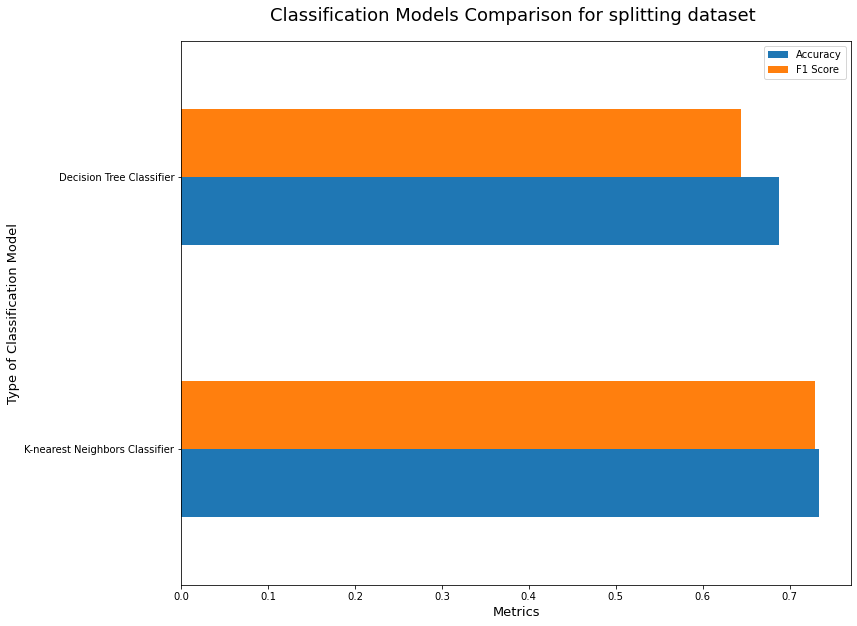

In [163]:
model_compare_visual(s3model_compare)